# Project 3 NLA: SVD applications

Àlex Escolà Nixon

## - Graphics compression


##### 1. The SVD factorization has the property of giving the best low rank approximation matrix
with respect to the Frobenius and/or the 2-norm to a given matrix. State properly the
previous statement and write down the corresponding proofs for the Frobenius norm and
the 2-norm.

It is proven that a matrix of rank $k<n$ closest to A, measured in terms of the $\left \|  ·\right \|_2$, is $A_k = \sum_{i=1}^{k} \sigma_i u_i v_i^T$. As also that $\left \|  A-A_k\right \|_2=\sigma _{k+1}$.

Proof:

$A_k$ has rank k by construction and:

\begin{equation}
\left \|  A-A_k\right \|_2=  \left \| \sum_{i=k+1}^{n} \sigma_i u_i v_i^T \right \| = \left \| U\begin{bmatrix}
0 &  &  & \\ 
 &\sigma_{k+1 }  &  & \\ 
 &  & \ddots & \\ 
 &  &  & \sigma _n
\end{bmatrix}V^T \right \|_2 =\sigma _{k+1}
\end{equation}

Furthermore, in order to proof that there is no closer rank k matrix than to A.

Let B be a rank k matrix, so its null space is n-k. The space spanned by $\{v_1 , ..., v_{k+1}\}$ has dimension k+1. Since the sum of both spaces is greater than n, they must overlap.

Let h be a unit vector in their intersection, then:

\begin{equation}
\left \|  A-B\right \|^2_2= \left \|  \left (A-B\right)h\right \|^2_2=
\left \|  Ah\right \|^2_2 = \left \|  U\Sigma V^T h\right \|^2_2=
\sigma^2_{k+1}\left \|  V^Th\right \|^2_2=\sigma^2_{k+1}
\end{equation}

And this is also satisfied in terms of the Fobernius norm:

For any matrix B of rank at most k:

\begin{equation}
\left \|  A-A_k\right \|_F= \leqslant \left \|  A-B\right \|_F
\end{equation}

Let B minimize the previous Forbernius norm for all rank k or less matrices. Let V be the space spanned by the rows of B. Now, since B minimizes $\left \|  A-B \right \|_F$, each row of B must be the prohection of the correspondng row of A onto B, and it therefore follows that $\left \|  A-B \right \|_F$ is thesum of squared distances of rows of A to V. Since $A_k$ minimizes the sum of the squared distance of rows of A to any k-dimensional subspace, it follows that $\left \|  A-A_k\right \|_F= \leqslant \left \|  A-B\right \|_F$

##### 2. Use the previous results to obtain a lossy compressed graphic image from a .jpeg graphic file.

In [1]:
import numpy as np
import pandas as pd
import random 
from scipy.linalg import qr,inv,eig,svd
from numpy.linalg import norm,matrix_rank
from scipy.ndimage import imread
from scipy.misc import imsave
%matplotlib inline
import matplotlib.pyplot as plt
from scipy import sparse
from sklearn.decomposition import PCA

Here a black and white image is imported:

In [10]:
A=imread('imgs/square.jpg',flatten=True)

The SVD decomposition is computed below:

In [11]:
U,S,V = svd(A,full_matrices=False)
A.shape

(800, 800)

In [12]:
print U.shape, S.shape, V.T.shape

(800, 800) (800,) (800, 800)


The Forbernius norm can easily be computed as the squared of the singular values:

\begin{equation}
\left \| A \right \|_F=\left ( \sum_{ij}A_{ij}^2\right )^{1/2} = \sum \sigma_i^2 (A)
\end{equation}

In [20]:
Frob_norm = np.sqrt(sum(S**2))
print Frob_norm
print "Same as doing norm(A,'fro'):", norm(A,'fro')

143343.085258
Same as doing norm(A,'fro'): 143343.0


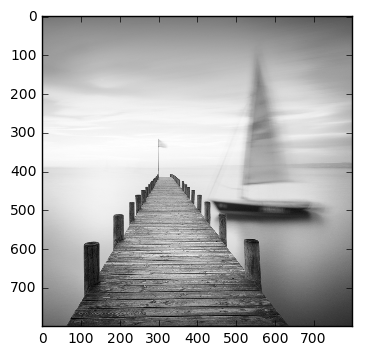

In [21]:
plt.imshow(A, cmap='gray')

The percentage of the Forbernius norm capatured in the compressde image can be calculated directly as the division between both quantities or also as:

\begin{equation}
\left [ \frac{\sum_{i=r+1}^{n}\sigma _i^2}{\sum_{i=1}^{n}\sigma _i^2} \right ]
\end{equation}

Where r is the rank of the compressed image and n the rank of the original image.
As it shown with the following code:

In [97]:
Uk,Sk,Vk = svd(Ak0,full_matrices=False)
frob_norm = round(np.sqrt(sum(Sk**2))/np.sqrt(sum(S**2)),5)

Ak0_n = round(norm(Ak0,'fro')/norm(A,'fro'),5)
Ak0_n

print frob_norm
print Ak0_n

0.98622
0.98622


Here images with different rank approximations are shown. From a k=1 to k=512, being k the lower rank approximation of the original matrix.

In [109]:
k0=1
k1=2
k2=4
k3=8
k4=16
k5=32
k6=64
k7=128
k8=256
k9=512

Ak0 = np.matrix(U[:, :k0]) * np.diag(S[:k0]) * np.matrix(V[:k0, :])
Ak1 = np.matrix(U[:, :k1]) * np.diag(S[:k1]) * np.matrix(V[:k1, :])
Ak2 = np.matrix(U[:, :k2]) * np.diag(S[:k2]) * np.matrix(V[:k2, :])
Ak3 = np.matrix(U[:, :k3]) * np.diag(S[:k3]) * np.matrix(V[:k3, :])
Ak4 = np.matrix(U[:, :k4]) * np.diag(S[:k4]) * np.matrix(V[:k4, :])
Ak5 = np.matrix(U[:, :k5]) * np.diag(S[:k5]) * np.matrix(V[:k5, :])
Ak6 = np.matrix(U[:, :k6]) * np.diag(S[:k6]) * np.matrix(V[:k6, :])
Ak7 = np.matrix(U[:, :k7]) * np.diag(S[:k7]) * np.matrix(V[:k7, :])
Ak8 = np.matrix(U[:, :k8]) * np.diag(S[:k8]) * np.matrix(V[:k8, :])
Ak9 = np.matrix(U[:, :k9]) * np.diag(S[:k9]) * np.matrix(V[:k9, :])


Ak0_n = norm(Ak0,'fro')/norm(A,'fro')
Ak1_n = norm(Ak1,'fro')/norm(A,'fro')
Ak2_n = norm(Ak2,'fro')/norm(A,'fro')
Ak3_n = norm(Ak3,'fro')/norm(A,'fro')
Ak4_n = norm(Ak4,'fro')/norm(A,'fro')
Ak5_n = norm(Ak5,'fro')/norm(A,'fro')
Ak6_n = norm(Ak6,'fro')/norm(A,'fro')
Ak7_n = norm(Ak7,'fro')/norm(A,'fro')
Ak8_n = norm(Ak8,'fro')/norm(A,'fro')
Ak9_n = norm(Ak9,'fro')/norm(A,'fro')

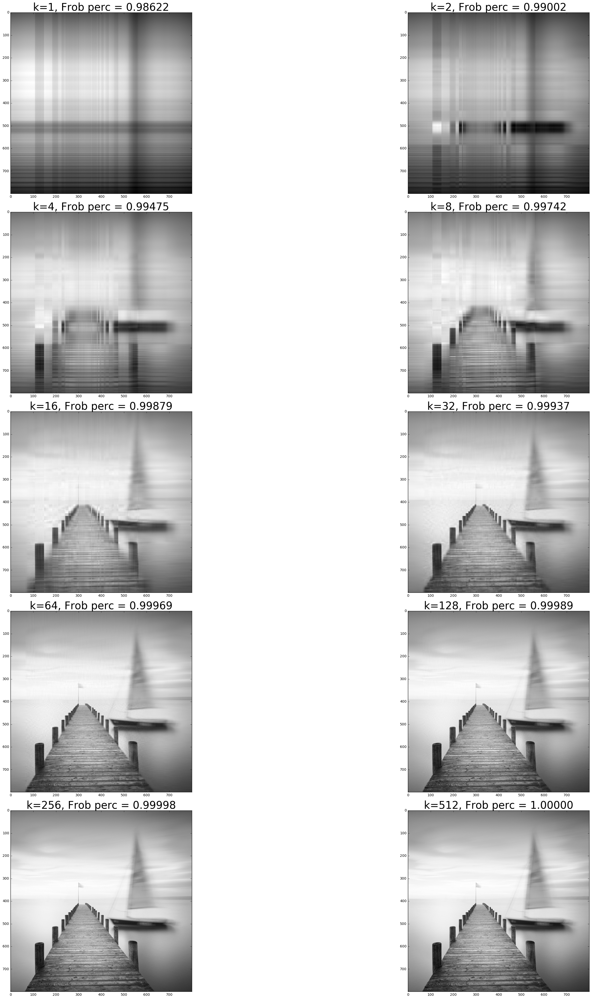

In [110]:
fig = plt.figure()
fig.set_size_inches(40,40)

ax1 = fig.add_subplot(521)
ax1.imshow(Ak0, cmap='gray')
plt.title(r'k=1, Frob perc = %.5f' %(Ak0_n),size=30)

ax2 = fig.add_subplot(522)
ax2.imshow(Ak1, cmap='gray')
plt.title(r'k=2, Frob perc = %.5f' %(Ak1_n),size=30)

ax3 = fig.add_subplot(523)
ax3.imshow(Ak2, cmap='gray')
plt.title(r'k=4, Frob perc = %.5f' %(Ak2_n),size=30)

ax4 = fig.add_subplot(524)
ax4.imshow(Ak3, cmap='gray')
plt.title(r'k=8, Frob perc = %.5f' %(Ak3_n),size=30)


ax5 = fig.add_subplot(525)
ax5.imshow(Ak4, cmap='gray')
plt.title(r'k=16, Frob perc = %.5f' %(Ak4_n),size=30)

ax6 = fig.add_subplot(526)
ax6.imshow(Ak5, cmap='gray')
plt.title(r'k=32, Frob perc = %.5f' %(Ak5_n),size=30)

ax7 = fig.add_subplot(527)
ax7.imshow(Ak6, cmap='gray')
plt.title(r'k=64, Frob perc = %.5f' %(Ak6_n),size=30)

ax8 = fig.add_subplot(528)
ax8.imshow(Ak7, cmap='gray')
plt.title(r'k=128, Frob perc = %.5f' %(Ak7_n),size=30)

ax9 = fig.add_subplot(529)
ax9.imshow(Ak8, cmap='gray')
plt.title(r'k=256, Frob perc = %.5f' %(Ak8_n),size=30)

ax10 = fig.add_subplot(5,2,10)
ax10.imshow(Ak9, cmap='gray')
plt.title(r'k=512, Frob perc = %.5f' %(Ak9_n),size=30)

plt.tight_layout() 


Here the same analysis is performed with another image:

In [126]:
A=imread('imgs/flor.jpg',flatten=True)

In [127]:
A.shape

(800, 1200)

In [128]:
U,S,V = svd(A,full_matrices=False)

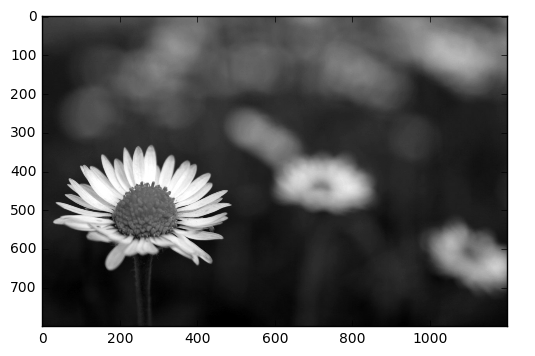

In [129]:
plt.imshow(A,cmap='gray')

In [130]:
k0=1
k1=2
k2=4
k3=8
k4=16
k5=32
k6=64
k7=128
k8=256
k9=512

Ak0 = np.matrix(U[:, :k0]) * np.diag(S[:k0]) * np.matrix(V[:k0, :])
Ak1 = np.matrix(U[:, :k1]) * np.diag(S[:k1]) * np.matrix(V[:k1, :])
Ak2 = np.matrix(U[:, :k2]) * np.diag(S[:k2]) * np.matrix(V[:k2, :])
Ak3 = np.matrix(U[:, :k3]) * np.diag(S[:k3]) * np.matrix(V[:k3, :])
Ak4 = np.matrix(U[:, :k4]) * np.diag(S[:k4]) * np.matrix(V[:k4, :])
Ak5 = np.matrix(U[:, :k5]) * np.diag(S[:k5]) * np.matrix(V[:k5, :])
Ak6 = np.matrix(U[:, :k6]) * np.diag(S[:k6]) * np.matrix(V[:k6, :])
Ak7 = np.matrix(U[:, :k7]) * np.diag(S[:k7]) * np.matrix(V[:k7, :])
Ak8 = np.matrix(U[:, :k8]) * np.diag(S[:k8]) * np.matrix(V[:k8, :])
Ak9 = np.matrix(U[:, :k9]) * np.diag(S[:k9]) * np.matrix(V[:k9, :])


Ak0_n = norm(Ak0,'fro')/norm(A,'fro')
Ak1_n = norm(Ak1,'fro')/norm(A,'fro')
Ak2_n = norm(Ak2,'fro')/norm(A,'fro')
Ak3_n = norm(Ak3,'fro')/norm(A,'fro')
Ak4_n = norm(Ak4,'fro')/norm(A,'fro')
Ak5_n = norm(Ak5,'fro')/norm(A,'fro')
Ak6_n = norm(Ak6,'fro')/norm(A,'fro')
Ak7_n = norm(Ak7,'fro')/norm(A,'fro')
Ak8_n = norm(Ak8,'fro')/norm(A,'fro')
Ak9_n = norm(Ak9,'fro')/norm(A,'fro')

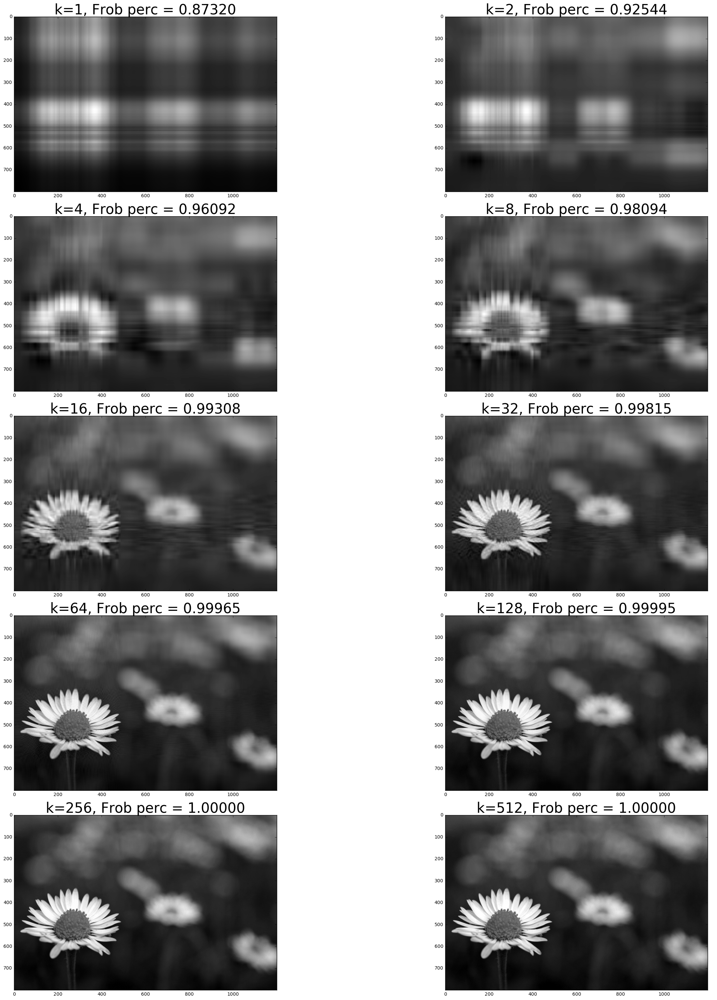

In [131]:
fig = plt.figure()
fig.set_size_inches(30,30)

ax1 = fig.add_subplot(521)
ax1.imshow(Ak0, cmap='gray')
plt.title(r'k=1, Frob perc = %.5f' %(Ak0_n),size=30)

ax2 = fig.add_subplot(522)
ax2.imshow(Ak1, cmap='gray')
plt.title(r'k=2, Frob perc = %.5f' %(Ak1_n),size=30)

ax3 = fig.add_subplot(523)
ax3.imshow(Ak2, cmap='gray')
plt.title(r'k=4, Frob perc = %.5f' %(Ak2_n),size=30)

ax4 = fig.add_subplot(524)
ax4.imshow(Ak3, cmap='gray')
plt.title(r'k=8, Frob perc = %.5f' %(Ak3_n),size=30)


ax5 = fig.add_subplot(525)
ax5.imshow(Ak4, cmap='gray')
plt.title(r'k=16, Frob perc = %.5f' %(Ak4_n),size=30)

ax6 = fig.add_subplot(526)
ax6.imshow(Ak5, cmap='gray')
plt.title(r'k=32, Frob perc = %.5f' %(Ak5_n),size=30)

ax7 = fig.add_subplot(527)
ax7.imshow(Ak6, cmap='gray')
plt.title(r'k=64, Frob perc = %.5f' %(Ak6_n),size=30)

ax8 = fig.add_subplot(528)
ax8.imshow(Ak7, cmap='gray')
plt.title(r'k=128, Frob perc = %.5f' %(Ak7_n),size=30)

ax9 = fig.add_subplot(529)
ax9.imshow(Ak8, cmap='gray')
plt.title(r'k=256, Frob perc = %.5f' %(Ak8_n),size=30)

ax10 = fig.add_subplot(5,2,10)
ax10.imshow(Ak9, cmap='gray')
plt.title(r'k=512, Frob perc = %.5f' %(Ak9_n),size=30)

plt.tight_layout() 



Here the same analysis is performed with an image with more information. The image has more specifically a size of (180,1920).

In [189]:
imsave('./High_res/Ak_rank_256_frob_perc_99.569.jpg',Ak8)

In [178]:
A=imread('imgs/rails.jpg',flatten=True)

In [179]:
A.shape

(1080, 1920)

In [180]:
U,S,V = svd(A,full_matrices=False)

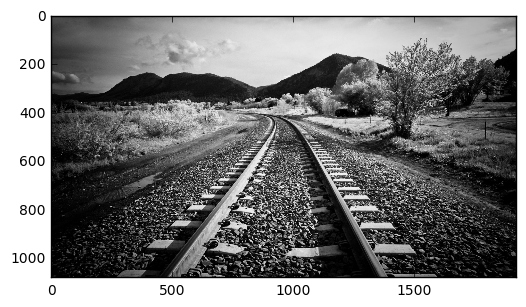

In [181]:
plt.imshow(A,cmap='gray')

In [182]:
k0=1
k1=2
k2=4
k3=8
k4=16
k5=32
k6=64
k7=128
k8=256
k9=512

Ak0 = np.matrix(U[:, :k0]) * np.diag(S[:k0]) * np.matrix(V[:k0, :])
Ak1 = np.matrix(U[:, :k1]) * np.diag(S[:k1]) * np.matrix(V[:k1, :])
Ak2 = np.matrix(U[:, :k2]) * np.diag(S[:k2]) * np.matrix(V[:k2, :])
Ak3 = np.matrix(U[:, :k3]) * np.diag(S[:k3]) * np.matrix(V[:k3, :])
Ak4 = np.matrix(U[:, :k4]) * np.diag(S[:k4]) * np.matrix(V[:k4, :])
Ak5 = np.matrix(U[:, :k5]) * np.diag(S[:k5]) * np.matrix(V[:k5, :])
Ak6 = np.matrix(U[:, :k6]) * np.diag(S[:k6]) * np.matrix(V[:k6, :])
Ak7 = np.matrix(U[:, :k7]) * np.diag(S[:k7]) * np.matrix(V[:k7, :])
Ak8 = np.matrix(U[:, :k8]) * np.diag(S[:k8]) * np.matrix(V[:k8, :])
Ak9 = np.matrix(U[:, :k9]) * np.diag(S[:k9]) * np.matrix(V[:k9, :])


Ak0_n = norm(Ak0,'fro')/norm(A,'fro')
Ak1_n = norm(Ak1,'fro')/norm(A,'fro')
Ak2_n = norm(Ak2,'fro')/norm(A,'fro')
Ak3_n = norm(Ak3,'fro')/norm(A,'fro')
Ak4_n = norm(Ak4,'fro')/norm(A,'fro')
Ak5_n = norm(Ak5,'fro')/norm(A,'fro')
Ak6_n = norm(Ak6,'fro')/norm(A,'fro')
Ak7_n = norm(Ak7,'fro')/norm(A,'fro')
Ak8_n = norm(Ak8,'fro')/norm(A,'fro')
Ak9_n = norm(Ak9,'fro')/norm(A,'fro')

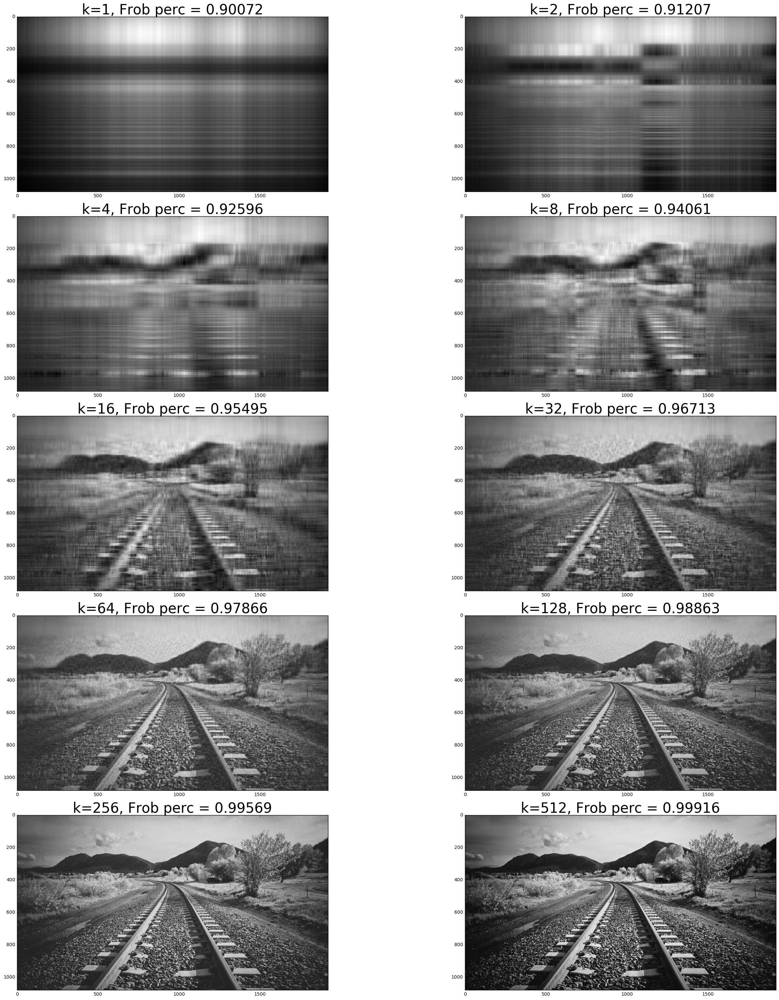

In [183]:
fig = plt.figure()
fig.set_size_inches(30,30)

ax1 = fig.add_subplot(521)
ax1.imshow(Ak0, cmap='gray')
plt.title(r'k=1, Frob perc = %.5f' %(Ak0_n),size=30)

ax2 = fig.add_subplot(522)
ax2.imshow(Ak1, cmap='gray')
plt.title(r'k=2, Frob perc = %.5f' %(Ak1_n),size=30)

ax3 = fig.add_subplot(523)
ax3.imshow(Ak2, cmap='gray')
plt.title(r'k=4, Frob perc = %.5f' %(Ak2_n),size=30)

ax4 = fig.add_subplot(524)
ax4.imshow(Ak3, cmap='gray')
plt.title(r'k=8, Frob perc = %.5f' %(Ak3_n),size=30)


ax5 = fig.add_subplot(525)
ax5.imshow(Ak4, cmap='gray')
plt.title(r'k=16, Frob perc = %.5f' %(Ak4_n),size=30)

ax6 = fig.add_subplot(526)
ax6.imshow(Ak5, cmap='gray')
plt.title(r'k=32, Frob perc = %.5f' %(Ak5_n),size=30)

ax7 = fig.add_subplot(527)
ax7.imshow(Ak6, cmap='gray')
plt.title(r'k=64, Frob perc = %.5f' %(Ak6_n),size=30)

ax8 = fig.add_subplot(528)
ax8.imshow(Ak7, cmap='gray')
plt.title(r'k=128, Frob perc = %.5f' %(Ak7_n),size=30)

ax9 = fig.add_subplot(529)
ax9.imshow(Ak8, cmap='gray')
plt.title(r'k=256, Frob perc = %.5f' %(Ak8_n),size=30)

ax10 = fig.add_subplot(5,2,10)
ax10.imshow(Ak9, cmap='gray')
plt.title(r'k=512, Frob perc = %.5f' %(Ak9_n),size=30)

plt.tight_layout() 




As it can be seen in the case of this last image, given that it contained much more information, the percentage of the Frobernius norm captured in the compressed image is lower for most values of k, being k the lower rank approximation of the original matrix. It can also be seen from the images directly, how the compression in this last case seems more lossy compared to before, even for higher rank approximations. 

The reason behind this is that the original matrix rank in this last case is much higher than before, therefore more information is lost when the rank is reduced.

In [150]:
print np.matrix(U).shape ,np.diag(S).shape, np.matrix(V).shape
print
print 'Compression to rank k=4'
print
k=16
print np.matrix(U[:, :k]).shape ,np.diag(S[:k]).shape, np.matrix(V[:k, :]).shape

(800, 800) (800, 800) (800, 1200)

Compression to rank k=4

(800, 16) (16, 16) (16, 1200)


It is interesting to see how in all cases the size of the image is mantained even after the compression. The reaso behind this  can easily be seen from the matrix product that is performed in the above expression. As it can be seen, whatever factor k is used to compress the image, the outer dimensions (800x1200) will remain the same once the matrix product is performed, and therefore the final image dimension.

However, as shown with the saved files, the size of the final file is much lower after the compression.

For example, in the case of this last image, the original file had a size of 750 KB, and the size is reduced to 365 KB for a rank approximation of k=256 and 176 KB for a 16 rank approximation.

## - Principal component analysis (PCA)

### Small dataset (example.dat)

In [195]:
example=[]
with open('data/example.dat') as f:
    for line in f:
        numbers_float = map(float, line.split())
        numbers_float = np.reshape(numbers_float,(len(numbers_float),1)).T
        example = np.concatenate((example,np.array(numbers_float)[0]),axis=0)
X = np.reshape(example,(16,4)).T

In [196]:
print X

[[ 6.  7.  6.  5.  7.  6.  5.  6.  3.  1.  2.  5.  2.  3.  1.  2.]
 [ 5.  3.  4.  7.  7.  4.  7.  5.  5.  3.  6.  7.  4.  5.  6.  3.]
 [ 3.  2.  4.  1.  5.  2.  2.  4.  6.  7.  6.  7.  5.  6.  5.  7.]
 [ 4.  2.  5.  3.  5.  3.  1.  4.  7.  5.  7.  6.  6.  5.  5.  7.]]


##### Review of the example shown in the link

In order to look for eigenvalues/eigenvectors of the correlation matrix, firstly the data must be standardized. In order to standardize the data to a $\mathcal{N}\left (0,1\right)$, subtract its mean and divide by its standard deviation of each variable.

In [197]:
mitja = np.apply_along_axis(np.mean,1,X)
std = np.apply_along_axis(np.std,1,X)
for i in range(len(X)):
    X[i,:] = (X[i,:] - mitja[i])/std[i]

In [198]:
Y_tmp = 1./len(X) * X.T
Y = Y_tmp.T.dot(Y_tmp)
print Y

[[ 1.          0.1856123  -0.63202219 -0.5802668 ]
 [ 0.1856123   1.         -0.14621516 -0.11858645]
 [-0.63202219 -0.14621516  1.          0.85285436]
 [-0.5802668  -0.11858645  0.85285436  1.        ]]


Here the actual correlation matrix is taken in order to perform the PCA analysys. It must be taken into account that the use of this matrix can give place to numerical instabilities as sepcified in the project statement. Further on the the PCA analysis is performed with the reduced SVD computation of Y.

It can be checked that this is indeed the correlation matrix by taking the np.corrcoef function of our data:

In [200]:
print np.corrcoef([[ 6.,  7.,  6.,  5.,  7.,  6.,  5.,  6.,  3.,  1.,  2.,  5.,  2.,
         3.,  1.,  2.],
       [ 5.,  3.,  4.,  7.,  7.,  4.,  7.,  5.,  5.,  3.,  6.,  7.,  4.,
         5.,  6.,  3.],
       [ 3.,  2.,  4.,  1.,  5.,  2.,  2.,  4.,  6.,  7.,  6.,  7.,  5.,
         6.,  5.,  7.],
       [ 4.,  2.,  5.,  3.,  5.,  3.,  1.,  4.,  7.,  5.,  7.,  6.,  6.,
         5.,  5.,  7.]])

[[ 1.          0.1856123  -0.63202219 -0.5802668 ]
 [ 0.1856123   1.         -0.14621516 -0.11858645]
 [-0.63202219 -0.14621516  1.          0.85285436]
 [-0.5802668  -0.11858645  0.85285436  1.        ]]


Here theactual correlation matrix is used in order to  compare results with thoes in the link shown bellow. Further down the method suggested in the project statement is implemented, in ehich only Y is used for the SVD decoposition.

In [47]:
U,S,V = svd(Y,full_matrices=False)

From the link http://yatani.jp/teaching/doku.php?id=hcistats:PCA , the obtained result having performed PCA is as follows:

For these values the correlation matrix has been used, not the covariance matrix. Therefore the data has also been standardized. 

The obtained principal components from the link are:

As specified in the project statement the principal components are the eigenvectors of $C_X$. And the $v_i$ direction accounts for the ratio of $\lambda _i / \sum_{j=1}^{p}\lambda_j$ of the total variance of the dataset X. We hence firstly begin by analyzing the portion of the total variance accumulated in each of the principal components, which is obtained from the eigenvalues as:

In [52]:
S/sum(S)

array([ 0.60757275,  0.24030055,  0.11616759,  0.03595911])

The standart deviation is calculated as the squared root of the sigular values, which corresponds to the eigenvalues. Thse are calculated bellow:

In [51]:
np.sqrt(S)

array([ 1.55893906,  0.9804092 ,  0.68166733,  0.37925777])

As it can be seen the values are the same as in the link shown above. The coefficients with a very low value are missregarded in the example.

And the loadings, which mean the coefficients for the “new” variables, are obtained from the eigenvectors $u_i$:

In [34]:
U

array([[-0.5229138 ,  0.00807487,  0.84835246, -0.08242604],
       [-0.17713905,  0.97675554, -0.119866  , -0.01423081],
       [ 0.59652595,  0.13369503,  0.29507268, -0.73431229],
       [ 0.58252871,  0.16735905,  0.42292122,  0.67363855]])

In [35]:
V

array([[-0.5229138 , -0.17713905,  0.59652595,  0.58252871],
       [ 0.00807487,  0.97675554,  0.13369503,  0.16735905],
       [ 0.84835246, -0.119866  ,  0.29507268,  0.42292122],
       [-0.08242604, -0.01423081, -0.73431229,  0.67363855]])

It is interesting to observ that,  as the correlation matrix is used in this example, which is symmetric, the rows of U are the columns of V, as $U=V^T$

Expression of the original dataset in the new PCA coordinates

Comp.1 = -0.523 * Price - 0.177 * Software + 0.597 * Aesthetics + 0.583 * Brand

##### PCA analysis using the correlation matrix (reduced SVD decomposition of Y)

Here the reduced SVD decomposition proposed in the project statement is used.
The reason for which it is convenient to consider the decoposition of Y instead of the covariance or correlation matrix is due to the fact that these matrices present higher condition numbers. The intuition behind this is that when the covariance matrix is taken, the cross product of $X_0$ (the centered data is calculated over itself, and threrefore the ratio between the largest and smallest eigenvalue is squared, which is precisely the definition of the condition number.

Here the PCA analysis is performed on the correlation matrix, therefpre the data must be centered and the standart deviation divided for the samples of each variable:

\begin{equation}
\rho_{XX} = E\left[\left(X-\mu_X\right)\left (Y-\mu_Y\right)\right]/\left (\sigma_x \sigma_y \right)
\end{equation}

In [58]:
mitja = np.apply_along_axis(np.mean,1,X)
std = np.apply_along_axis(np.std,1,X)
for i in range(len(X)):
    X[i,:] = (X[i,:] - mitja[i])/std[i]

In [59]:
Y = 1./len(X) * X.T

And now we take $Y=\frac{1}{n-1}X^t$ for the SVD:

In [60]:
U,S,V = svd(Y,full_matrices=False)

As explained in the project statement, here the singular values $s_i$ are such that $s_i^2=\lambda_i$

In [61]:
S**2

array([ 2.43029099,  0.96120221,  0.46467035,  0.14383645])

As already mentioned the standart deviation is the square root of the variance, which is precisely S in this case:

In [62]:
S

array([ 1.55893906,  0.9804092 ,  0.68166733,  0.37925777])

And as before, the portion of the total vairance in each of the principal components is obtained as $\lambda _i / \sum_{j=1}^{p}\lambda_j$

In [40]:
S**2/sum(S**2)

array([ 0.60757275,  0.24030055,  0.11616759,  0.03595911])

And finally V contains the eigenvectors of $Y^y Y=C_X$ as columns:

In [63]:
V

array([[-0.5229138 , -0.17713905,  0.59652595,  0.58252871],
       [ 0.00807487,  0.97675554,  0.13369503,  0.16735905],
       [-0.84835246,  0.119866  , -0.29507268, -0.42292122],
       [ 0.08242604,  0.01423081,  0.73431229, -0.67363855]])

The new PCA coordinates $V^TX$. Given that the returned V matrix from the SVD decomposition is already transposed, therefore it containes the singular vectors as rows, the calculation is performed bellow is expressed as $VX$

In [68]:
PCA_coord = np.matrix.round(V.dot(X),3)
print PCA_coord

[[-1.145 -2.136 -0.375 -2.094 -0.691 -1.668 -2.462 -0.837  1.552  1.936
   1.682  0.77   1.282  0.876  0.95   2.36 ]
 [-0.206 -1.827 -0.72   0.917  1.395 -1.053  0.791 -0.137  0.281 -1.214
   0.958  1.622 -0.57   0.087  0.691 -1.015]
 [-0.351 -0.285 -0.833  0.776 -1.145 -0.037  1.115 -0.504 -0.315  0.677
   0.179 -0.875  0.41   0.177  1.233 -0.224]
 [-0.228  0.195 -0.25  -0.615  0.199 -0.226  0.546  0.151 -0.384  0.678
  -0.414  0.486 -0.422  0.399 -0.05  -0.064]]


The obtained results are also checked bellow using the PCA method from the Sklearn library:

In [69]:
k=4
pca=PCA(n_components=k)
pca.fit(X.T)
print pca.components_

[[ 0.5229138   0.17713905 -0.59652595 -0.58252871]
 [-0.00807487 -0.97675554 -0.13369503 -0.16735905]
 [-0.84835246  0.119866   -0.29507268 -0.42292122]
 [ 0.08242604  0.01423081  0.73431229 -0.67363855]]


As it can be seen the same loadings are obtained.

##### PCA analysis using the covariance matrix (reduced SVD decomposition of Y)

In this case the data is only centered. The standart deviation is not devided as seen in  the definition of covariance:

\begin{equation}
C_X = E\left[\left(X-\mu_X\right)\left (Y-\mu_Y\right)\right]
\end{equation}

In [84]:
mitja = np.apply_along_axis(np.mean,1,X)
for i in range(len(X)):
    X[i,:] = (X[i,:] - mitja[i])

In [85]:
Y = 1./len(X) * X.T

In [86]:
U,S,V = svd(Y,full_matrices=False)

As it can be seen bellow, the same values for the eigenvalues and the eigenvectors are obtained. Which is no surprise, given that the observables are measured in comparable units or same scale.

In [87]:
S**2/sum(S**2)

array([ 0.60757275,  0.24030055,  0.11616759,  0.03595911])

In [89]:
V

array([[-0.5229138 , -0.17713905,  0.59652595,  0.58252871],
       [ 0.00807487,  0.97675554,  0.13369503,  0.16735905],
       [-0.84835246,  0.119866  , -0.29507268, -0.42292122],
       [ 0.08242604,  0.01423081,  0.73431229, -0.67363855]])

And as before the new PCA coordinates are calculated as:

In [90]:
PCA_coord = np.matrix.round(V.dot(X),3)
print PCA_coord

[[-1.145 -2.136 -0.375 -2.094 -0.691 -1.668 -2.462 -0.837  1.552  1.936
   1.682  0.77   1.282  0.876  0.95   2.36 ]
 [-0.206 -1.827 -0.72   0.917  1.395 -1.053  0.791 -0.137  0.281 -1.214
   0.958  1.622 -0.57   0.087  0.691 -1.015]
 [-0.351 -0.285 -0.833  0.776 -1.145 -0.037  1.115 -0.504 -0.315  0.677
   0.179 -0.875  0.41   0.177  1.233 -0.224]
 [-0.228  0.195 -0.25  -0.615  0.199 -0.226  0.546  0.151 -0.384  0.678
  -0.414  0.486 -0.422  0.399 -0.05  -0.064]]


## 2. Larger dataset (RCsGoff.csv)

Firstly the data file is uploaded:

In [2]:
data_read = pd.read_csv('data/RCsGoff.csv',sep=",")

In [3]:
data_pd = data_read.drop('gene',axis=1)

In [4]:
X= data_pd.as_matrix()

As specified the PCA analysis is performed on the covariance matrix, therefore we must only substract the mean to the data:

In [5]:
mitja = np.apply_along_axis(np.mean,1,X)
for i in range(len(X)):
    X[i,:] = (X[i,:] - mitja[i])

In [6]:
Y = 1./len(X.T) * X.T

In [7]:
U,S,V = svd(Y,full_matrices=False)

In [11]:
V.shape

(20, 58581)

The portion of the total variance accumulated in each of the principal components is:

In [9]:
S**2/sum(S**2)

array([  7.22992594e-01,   1.57842329e-01,   6.68894499e-02,
         2.88742716e-02,   1.22625116e-02,   4.61307211e-03,
         3.62699544e-03,   1.57543600e-03,   4.11867010e-04,
         3.13703723e-04,   1.17329676e-04,   1.06240196e-04,
         1.02457334e-04,   8.10017966e-05,   5.17218512e-05,
         4.36865057e-05,   4.02040903e-05,   2.95185524e-05,
         2.56013594e-05,   8.71953934e-09])

Here the two first principal components are plotted in order to compare with the project statement. As it can be seen the same pattern is obteined. The principal components are obtained by performming the product $V^TX$. However, here the matrix V is not transposed given that it is already transposed when scipy.linalg.svd is used.

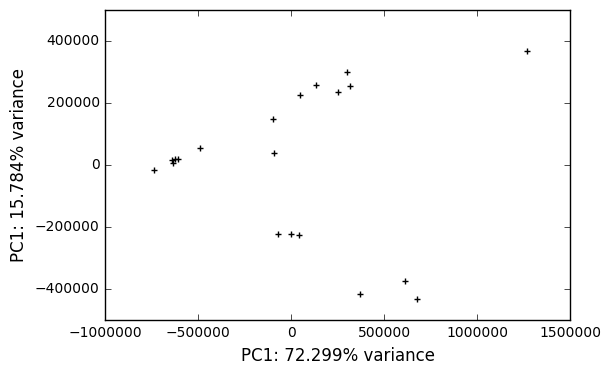

In [10]:
plt.scatter(V.dot(X)[0,:],V.dot(X)[1,:],marker='+',color='black')
plt.xlabel('PC1: %.3f' %(S[0]**2/sum(S**2)*100) + '% variance', fontsize=12)
plt.ylabel('PC1: %.3f' %(S[1]**2/sum(S**2)*100) + '% variance', fontsize=12)

The following code was performed in order to dump the obtained results into a csv file as specified in the exercise statement.

Firslty a matrix is created where each column corresponds to the loadings of one of the principal components.

In [151]:
PCi = np.zeros((20,20))
for i in range(0,19):
    PCi[:,i] = V.dot(X)[i,:]

In [152]:
sample = np.zeros(20)
sample = data_pd.columns.values

Proportion of the variance of each of the principal components.

In [153]:
variance = S**2/sum(S**2)

In [154]:
sample = np.reshape(sample,(20,1))
variance = np.reshape(variance,(20,1))

In [155]:
output = np.concatenate((sample,PCi,variance),axis=1)

In [157]:
import csv

In [160]:
with open('data/output.csv', 'wb') as f:
    writer = csv.writer(f)
    for row in output:
        writer.writerow(row)